In [1]:
# Import Library
import pandas as pd            # Mengimpor modul pandas untuk manipulasi dan analisis data tabular.
import seaborn as sns          # Mengimpor modul seaborn untuk visualisasi data statistik.
import matplotlib             # Mengimpor modul matplotlib untuk membuat plot dan visualisasi.
import matplotlib.pyplot as plt  # Mengimpor submodul pyplot dari matplotlib untuk membuat plot.

# Mengatur gaya plot menggunakan gaya 'ggplot'.
plt.style.use('ggplot')

# Mengimpor submodul figure dari matplotlib.pyplot.
from matplotlib.pyplot import figure

# Memastikan plot dihasilkan dalam output Jupyter Notebook.
%matplotlib inline

# Mengatur ukuran default untuk gambar (figure) yang akan dibuat.
matplotlib.rcParams['figure.figsize'] = (12, 8)

# Membaca data dari file 'movies.csv' dan menyimpannya ke dalam variabel 'df'.
df = pd.read_csv('movies.csv')


In [29]:
##Melihat Data
df.head(3)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorect
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,435
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,155
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,436


In [3]:
import numpy as np  # Mengimpor modul numpy untuk operasi numerik.

# Looping melalui setiap kolom dalam DataFrame df.
for col in df.columns:
    # Menghitung persentase data yang hilang (missing) dalam kolom menggunakan mean dari isnull().
    pct_missing = np.mean(df[col].isnull())
    # Mencetak nama kolom dan persentase data yang hilang.
    print('{} - {}%'.format(col, pct_missing))


name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [4]:
##data tipe setiap column
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [5]:
#merubah tipe data column
# Mengganti nilai NaN dengan 0 dalam kolom 'budget' dan 'gross'
df['budget'].fillna(0, inplace=True)
df['gross'].fillna(0, inplace=True)

# Mengubah tipe data kolom 'budget' dan 'gross' menjadi int64
df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')



In [30]:
df.head(3)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorect
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,435
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,155
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,436


In [7]:
##create correct year column
df['yearcorect'] = df['released'].astype(str).str[:14]

In [8]:
##fungsi inplace agar tidak merubah data asli
df = df.sort_values(by=['gross'], inplace=False, ascending=False)

In [9]:
pd.set_option('display.max_rows', None)

In [10]:
##drop any  Duplicate
df['company'].drop_duplicates().sort_values(ascending = False)

7129                                              thefyzz
5664                                          micro_scope
6412                             iDeal Partners Film Fund
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
524                             Zupnik-Curtis Enterprises
3330                          Zucker Brothers Productions
520                                      Zoetrope Studios
2213                                   Zeta Entertainment
6222                        Zentropa International Norway
3698                              Zentropa Entertainments
1175                                 Zenith Entertainment
5180                                      Zazen Produções
3193                                          ZapPictures
1321                             Zanuck/Brown Productions
1329          

In [32]:
df.head(3)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorect
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,435
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,155
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,436


In [12]:
##budged high corelation
##company high corelation

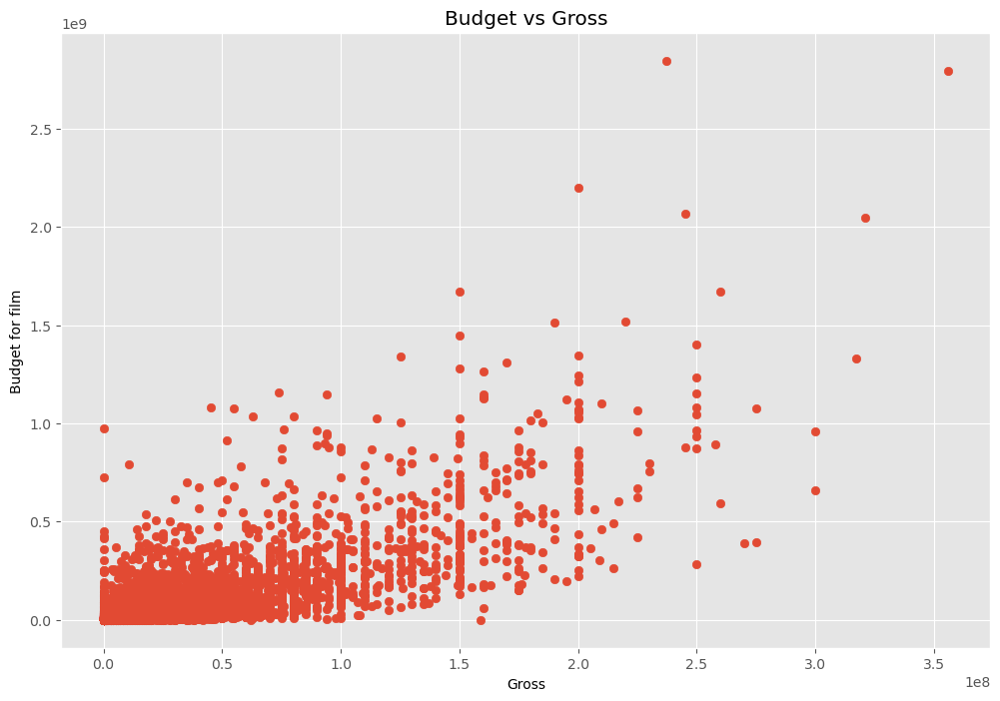

In [13]:
##Scatter plot with budged vs gross
plt.scatter(x=df['budget'], y=df['gross'])
plt.title('Budget vs Gross')
plt.xlabel('Gross')
plt.ylabel('Budget for film')
plt.show()

In [33]:
df.head(3)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorect
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,435
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,155
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,436


<Axes: xlabel='budget', ylabel='gross'>

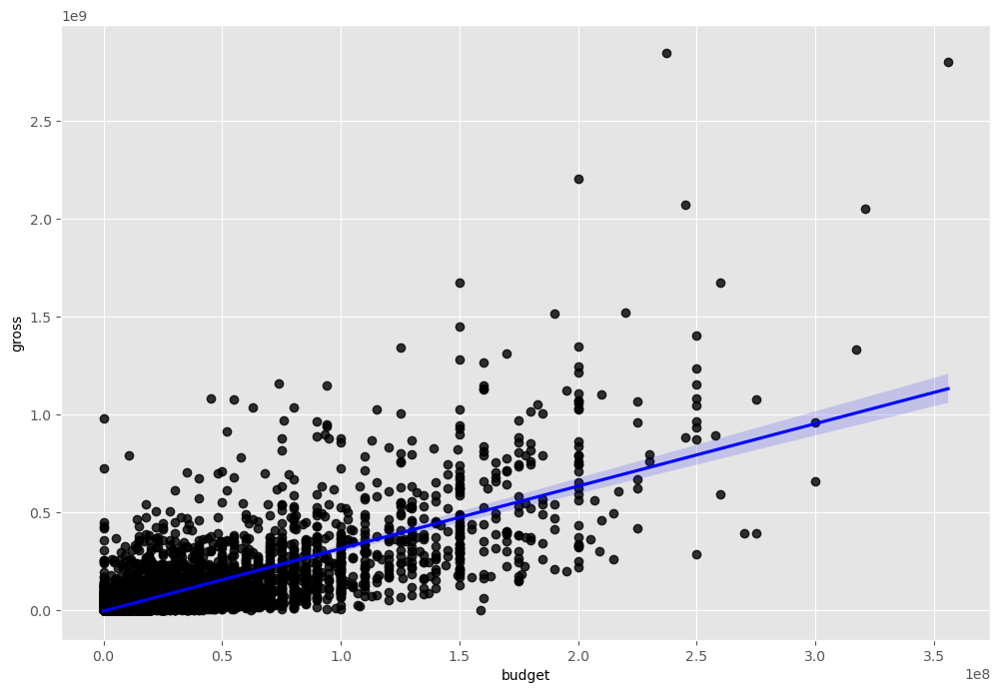

In [15]:
## plot budget vs gross using seaborn
sns.regplot(x='budget', y ='gross', data = df, scatter_kws={"color":"black"}, line_kws={"color" : "blue"})

In [16]:
##meliaha corelation
df.corr(method = 'pearson')

C:\Users\User\AppData\Local\Temp\ipykernel_12080\181113249.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr(method = 'pearson')


,year,score,votes,budget,gross,runtime
year,1.000000,0.097995,0.222945,0.309212,0.261900,0.120811
score,0.097995,1.000000,0.409182,0.055665,0.186392,0.399451
votes,0.222945,0.409182,1.000000,0.486862,0.632834,0.309212
budget,0.309212,0.055665,0.486862,1.000000,0.750157,0.269510
gross,0.261900,0.186392,0.632834,0.750157,1.000000,0.245235
runtime,0.120811,0.399451,0.309212,0.269510,0.245235,1.000000


C:\Users\User\AppData\Local\Temp\ipykernel_12080\4212624225.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr(method='pearson')


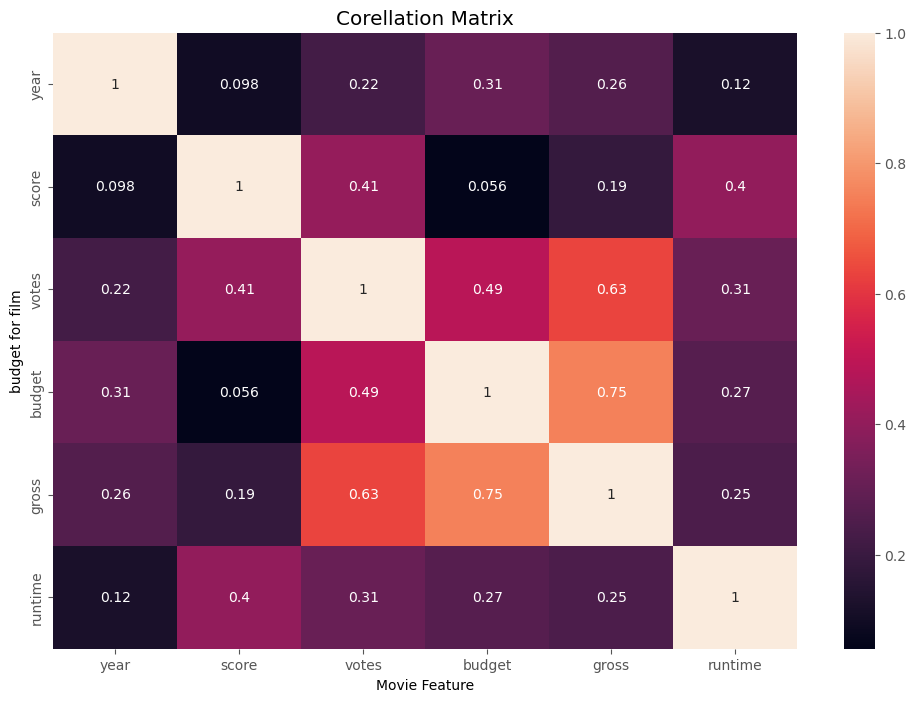

In [17]:
##high Korelasi antara budget dan gross
correlation_matrix = df.corr(method='pearson')
sns.heatmap(correlation_matrix, annot = True)
plt.title('Corellation Matrix')
plt.xlabel ('Movie Feature')
plt.ylabel('budget for film')
plt.show()

In [18]:
##Mencari Perusahaan
df.head ()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,"December 18, 2"
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,"April 26, 2019"
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,"December 19, 1"
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,"December 18, 2"
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,"April 27, 2018"


In [19]:
df_numerize =df
for col_name in df_numerize.columns:
    if (df_numerize[col_name].dtype == 'object'):
        df_numerize[col_name]=df_numerize[col_name].astype('category')
        df_numerize[col_name] =df_numerize[col_name].cat.codes
        
df_numerize

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorect
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,435
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,155
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,436
6663,5144,5,0,2015,698,7.8,876000.0,1125,2550,524,55,245000000,2069521700,1540,138.0,435
7244,536,5,0,2018,192,8.4,897000.0,162,743,2241,55,321000000,2048359754,1606,149.0,163
7480,6194,4,2,2019,1488,6.9,222000.0,1455,1919,676,55,260000000,1670727580,2316,118.0,713
6653,2969,5,0,2015,1704,7.0,593000.0,517,3568,437,55,150000000,1670516444,2281,124.0,915
6043,5502,5,0,2012,2472,8.0,1300000.0,1517,2314,2241,55,220000000,1518815515,1606,143.0,1579
6646,2145,5,0,2015,221,7.1,370000.0,1189,706,2721,55,190000000,1515341399,2281,137.0,190
7494,2131,4,2,2019,2676,6.8,148000.0,432,1950,1527,55,150000000,1450026933,2315,103.0,1652


In [20]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorect
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,435
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,155
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,436
6663,5144,5,0,2015,698,7.8,876000.0,1125,2550,524,55,245000000,2069521700,1540,138.0,435
7244,536,5,0,2018,192,8.4,897000.0,162,743,2241,55,321000000,2048359754,1606,149.0,163
7480,6194,4,2,2019,1488,6.9,222000.0,1455,1919,676,55,260000000,1670727580,2316,118.0,713
6653,2969,5,0,2015,1704,7.0,593000.0,517,3568,437,55,150000000,1670516444,2281,124.0,915
6043,5502,5,0,2012,2472,8.0,1300000.0,1517,2314,2241,55,220000000,1518815515,1606,143.0,1579
6646,2145,5,0,2015,221,7.1,370000.0,1189,706,2721,55,190000000,1515341399,2281,137.0,190
7494,2131,4,2,2019,2676,6.8,148000.0,432,1950,1527,55,150000000,1450026933,2315,103.0,1652


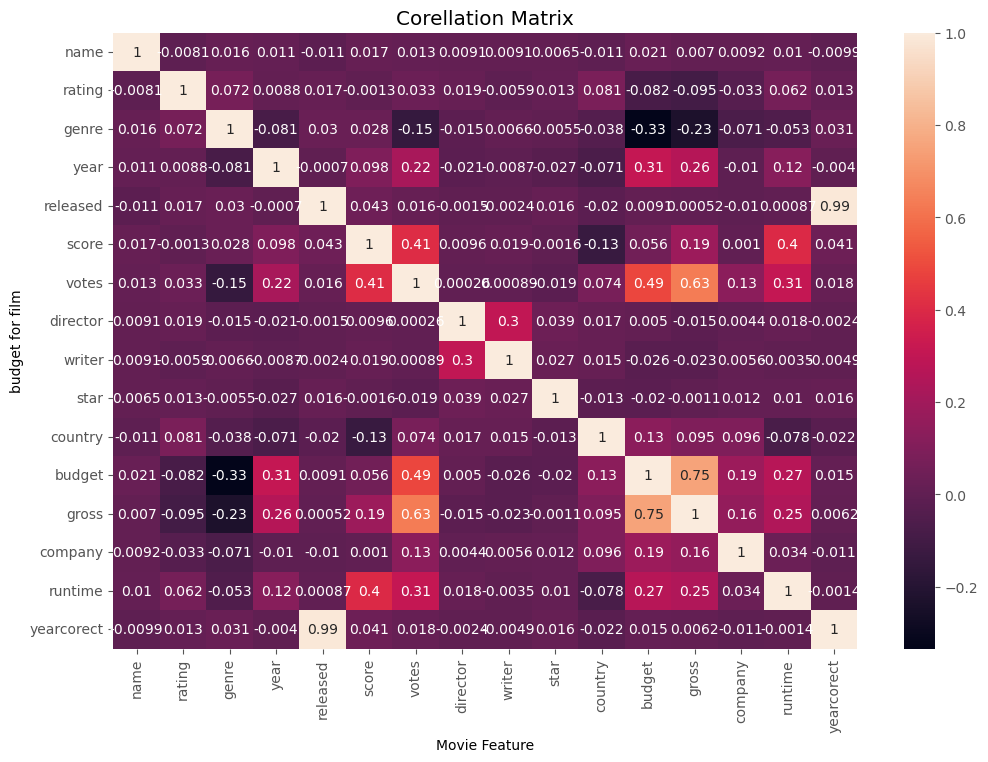

In [21]:
##high Korelasi antara budget dan gross
correlation_matrix = df_numerize.corr(method='pearson')
sns.heatmap(correlation_matrix, annot = True)
plt.title('Corellation Matrix')
plt.xlabel ('Movie Feature')
plt.ylabel('budget for film')
plt.show()

In [22]:
df_numerize.corr

<bound method DataFrame.corr of       name  rating  genre  year  released  score      votes  director  writer  \
5445   533       5      0  2009       696    7.8  1100000.0      1155    1778   
7445   535       5      0  2019       183    8.4   903000.0       162     743   
3045  6896       5      6  1997       704    7.8  1100000.0      1155    1778   
6663  5144       5      0  2015       698    7.8   876000.0      1125    2550   
7244   536       5      0  2018       192    8.4   897000.0       162     743   
7480  6194       4      2  2019      1488    6.9   222000.0      1455    1919   
6653  2969       5      0  2015      1704    7.0   593000.0       517    3568   
6043  5502       5      0  2012      2472    8.0  1300000.0      1517    2314   
6646  2145       5      0  2015       221    7.1   370000.0      1189     706   
7494  2131       4      2  2019      2676    6.8   148000.0       432    1950   
6644   534       5      0  2015      2235    7.3   777000.0      1517    2314

In [23]:


# Anda memiliki df_numerize, yaitu DataFrame yang telah diubah tipe datanya menjadi numerik.

# Hitung matriks korelasi antar kolom numerik dalam df_numerize
correlation_Nut = df_numerize.corr()

# Memanggil fungsi .unstack() pada objek correlation_Nut
correlation_stack = correlation_Nut.unstack()

# Hasil dari korelasi yang telah di-stacking
print(correlation_stack)


name        name          1.000000
            rating       -0.008069
            genre         0.016355
            year          0.011453
            released     -0.011311
            score         0.017097
            votes         0.013088
            director      0.009079
            writer        0.009081
            star          0.006472
            country      -0.010737
            budget        0.020548
            gross         0.006989
            company       0.009211
            runtime       0.010392
            yearcorect   -0.009927
rating      name         -0.008069
            rating        1.000000
            genre         0.072423
            year          0.008779
            released      0.016613
            score        -0.001314
            votes         0.033225
            director      0.019483
            writer       -0.005921
            star          0.013405
            country       0.081244
            budget       -0.081939
            gross   

In [26]:
sorted_pairs = correlation_stack.sort_values()

sorted_pairs

genre       budget       -0.334021
budget      genre        -0.334021
genre       gross        -0.234297
gross       genre        -0.234297
genre       votes        -0.145307
votes       genre        -0.145307
score       country      -0.133348
country     score        -0.133348
rating      gross        -0.095450
gross       rating       -0.095450
budget      rating       -0.081939
rating      budget       -0.081939
genre       year         -0.081261
year        genre        -0.081261
runtime     country      -0.078412
country     runtime      -0.078412
company     genre        -0.071067
genre       company      -0.071067
year        country      -0.070938
country     year         -0.070938
runtime     genre        -0.052711
genre       runtime      -0.052711
            country      -0.037615
country     genre        -0.037615
rating      company      -0.032943
company     rating       -0.032943
star        year         -0.027242
year        star         -0.027242
writer      budget  

In [27]:
high_corr = sorted_pairs[(sorted_pairs)>0.5]

In [28]:
high_corr

votes       gross         0.632834
gross       votes         0.632834
            budget        0.750157
budget      gross         0.750157
yearcorect  released      0.986617
released    yearcorect    0.986617
name        name          1.000000
company     company       1.000000
gross       gross         1.000000
budget      budget        1.000000
country     country       1.000000
star        star          1.000000
writer      writer        1.000000
director    director      1.000000
votes       votes         1.000000
score       score         1.000000
released    released      1.000000
year        year          1.000000
genre       genre         1.000000
rating      rating        1.000000
runtime     runtime       1.000000
yearcorect  yearcorect    1.000000
dtype: float64

In [ ]:
##Votes dan butged the highest correlation